# Reachability Analysis for Split Computing Neural Networks

## 1. Import Packages

In [1]:
begin
	import Pkg
	Pkg.activate("..")
	Pkg.instantiate()
	
    push!(LOAD_PATH, "$(@__DIR__)/../src")
    
    using NoisyReach
    using Random
    using Plots

    Random.seed!(123) # Setting the seed
    Plots.scalefontsizes(1) # Setting the fontsize
end

  Activating project at `~/Downloads/sc/NoisyReach.jl`


## 2. Physical System and Neural Networks Uncertainty Setup

In [2]:
const pointcloud_data = Dict(
    "casa" => Dict(
        00 => Dict("h" => 0.143, "μ" => 0.00152263964,    "σ" => 0.007658885094),
        10 => Dict("h" => 0.138, "μ" => 0.001523729862,   "σ" => 0.007658143094),
        20 => Dict("h" => 0.130, "μ" => 0.001523324907,   "σ" => 0.007658230589),
        30 => Dict("h" => 0.118, "μ" => 0.00153130724,    "σ" => 0.007661756172),
        40 => Dict("h" => 0.111, "μ" => 0.001543358673,   "σ" => 0.007666847492),
        50 => Dict("h" => 0.092, "μ" => 0.001548175175,   "σ" => 0.007674336748),
        60 => Dict("h" => 0.085, "μ" => 0.001581394221,   "σ" => 0.007728515042),
        70 => Dict("h" => 0.067, "μ" => -0.0004962842086, "σ" => 0.008602463024),
        80 => Dict("h" => 0.048, "μ" => 0.001462642226,   "σ" => 0.008448040669)
    ),
    "pointrcnn" => Dict(
        00 => Dict("h" => 0.124, "μ" => -0.0009738060476, "σ" => 0.008788003518),
        10 => Dict("h" => 0.118, "μ" => -0.001053894659,  "σ" => 0.008337296548),
        20 => Dict("h" => 0.113, "μ" => 0.001730441561,   "σ" => 0.0101784625),
        30 => Dict("h" => 0.098, "μ" => -0.0009030410659, "σ" => 0.01011617316),
        40 => Dict("h" => 0.087, "μ" => 0.002727671179,   "σ" => 0.01040193916),
        50 => Dict("h" => 0.076, "μ" => 0.002727671179,   "σ" => 0.01040193916),
        60 => Dict("h" => 0.071, "μ" => -0.001860074073,  "σ" => 0.01155979978),
        70 => Dict("h" => 0.062, "μ" => -0.000620727967,  "σ" => 0.01342376325),
        80 => Dict("h" => 0.056, "μ" => 0.003818349516,   "σ" => 0.01918789048)
    ),
    "pvrcnn" => Dict(
        00 => Dict("h" => 0.118, "μ" => 0.002607140768,   "σ" => 0.009798256915),
        10 => Dict("h" => 0.104, "μ" => -0.001700963688,  "σ" => 0.009194465126),
        20 => Dict("h" => 0.093, "μ" => -0.001685774595,  "σ" => 0.009199187262),
        30 => Dict("h" => 0.087, "μ" => -0.001679026757,  "σ" => 0.009200327987),
        40 => Dict("h" => 0.082, "μ" => -0.001678566427,  "σ" => 0.009202174448),
        50 => Dict("h" => 0.078, "μ" => -0.001679445833,  "σ" => 0.009210475394),
        60 => Dict("h" => 0.071, "μ" => -0.001657179205,  "σ" => 0.009230033394),
        70 => Dict("h" => 0.057, "μ" => 0.003999868343,   "σ" => 0.01411377181),
        80 => Dict("h" => 0.039, "μ" => -0.302009875,     "σ" => 0.9932999729)
    )
)

Dict{String, Dict{Int64, Dict{String, Float64}}} with 3 entries:
  "pointrcnn" => Dict(0=>Dict("μ"=>-0.000973806, "σ"=>0.008788, "h"=>0.124), 50…
  "casa"      => Dict(0=>Dict("μ"=>0.00152264, "σ"=>0.00765889, "h"=>0.143), 50…
  "pvrcnn"    => Dict(0=>Dict("μ"=>0.00260714, "σ"=>0.00979826, "h"=>0.118), 50…

In [3]:
const experiment = ("pvrcnn", 80)

("pvrcnn", 80)

In [4]:
sys = benchmarks[:F1]
const Dc  = 0.001

const h = pointcloud_data[experiment[1]][experiment[2]]["h"]
const μ = pointcloud_data[experiment[1]][experiment[2]]["μ"]
const σ = pointcloud_data[experiment[1]][experiment[2]]["σ"]

const T = 5
const H = floor(Int, T / h)
const N = 5000

5000

In [5]:
sys_ideal, K_ideal = synthesize(sys, h)
x₀ = fill(100., size(sys.A, 1))

2-element Vector{Float64}:
 100.0
 100.0

In [6]:
sys_aug, K_aug = synthesize(sys, h, Dc)
z₀ = [fill(100., size(sys.A, 1)); 0.]

3-element Vector{Float64}:
 100.0
 100.0
   0.0

## 3. Calculate and Plot Reachable Trajectories

In [7]:
traj_z, traj_u = unzip([simulate(sys_aug, K_uncertain(K_aug, σ, μ), H, z₀) for _ in 1:N])
traj_ideal_x, traj_ideal_u = simulate(sys_ideal, K_ideal, H, x₀)

([[100.0, 100.0], [110.73004805001283, -15.344788560056543], [101.52802538275046, -57.25499579704308], [85.86885358147074, -66.28876594875342], [69.63740657806126, -61.769987529822366], [55.13436373636771, -52.652441201487655], [43.02519265009366, -42.8834253568875], [33.275376155712934, -34.03820379010046], [25.589035359962836, -26.603538188204077], [19.606622221092536, -20.59498756225194]  …  [1.795320414463001e-12, -1.9217792639690953e-12], [1.366351081418255e-12, -1.462594172281366e-12], [1.0398785991921386e-12, -1.1131256085952931e-12], [7.914126286893844e-13, -8.471581823534577e-13], [6.023144906873053e-13, -6.447403423177779e-13], [4.583989849804303e-13, -4.906877105964232e-13], [3.4887028733329723e-13, -3.7344402626458727e-13], [2.655121005322762e-13, -2.8421425224445456e-13], [2.0207130870308747e-13, -2.1630481544145241e-13], [1.5378889971161504e-13, -1.646214882388034e-13]], [[-150.24398099617622], [-54.590731477920926], [-11.767064710432969], [5.885998555940965], [11.8761885

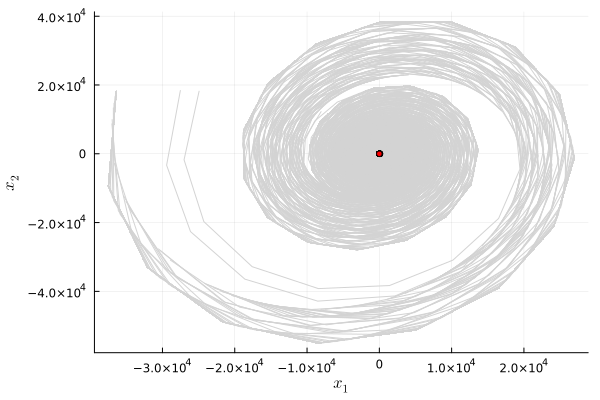

In [8]:
plot_trajectories(traj_z, traj_ideal_x, fname="NNe.svg")

In [9]:
maximum(tr_x -> tr_x[1], traj_ideal_x)

110.73004805001283

In [10]:
maximum(tr_x -> tr_x[2], traj_ideal_x)

100.0

In [11]:
maximum(tr_z -> maximum(z -> z[1], tr_z), traj_z)

26957.063855185144

In [12]:
maximum(tr_z -> maximum(z -> z[2], tr_z), traj_z)

38471.89084715333

In [13]:
maximum(tr_u -> tr_u[1], traj_ideal_u)

12.724769356556095

In [14]:
maximum(tr_u -> maximum(u -> abs(u[1]), tr_u), traj_u)

36119.66286977514

In [15]:
rmse₁ = 0.0
rmse₂ = 0.0
max_rel_deviation₁ = 0.0
max_rel_deviation₂ = 0.0

for tr_z in traj_z
    for k in 1:H
        pt_z = tr_z[k]
        pt_x = traj_ideal_x[k]
        
        rmse₁ += (pt_z[1] - pt_x[1]) ^ 2
        rmse₂ += (pt_z[2] - pt_x[2]) ^ 2

        max_rel_deviation₁ = max(max_rel_deviation₁, abs((pt_z[1] - pt_x[1]) / pt_x[1]))
        max_rel_deviation₂ = max(max_rel_deviation₂, abs((pt_z[2] - pt_x[2]) / pt_x[2]))
    end
    rmse₁ = (rmse₁ / H) ^ 0.5
    rmse₂ = (rmse₂ / H) ^ 0.5
end

In [16]:
rmse₁

109.14175661514436

In [17]:
rmse₂

12.241472644244814

In [18]:
max_rel_deviation₁

1.8546509895923914e17

In [19]:
max_rel_deviation₂

2.196978219970756e17